**Buenas, aqui comenzare mi proyecto acerca de accidentes aereos.**

Comenzare importando librerias de Python.

In [1]:
import pandas as pd
import numpy as np

Convertire el datasets "AccidentesAviones.csv" en un dataframe y elimino la columna 1 que contiene el indices de las filas.

In [2]:
Accidentes_aviones = pd.read_csv('AccidentesAviones.csv')

Eliminamos la columna indice, la cual no aporta ninguna utilidad.

In [3]:
Accidentes_aviones.drop('Unnamed: 0',axis=1,inplace=True)

Antes de comenzar con el EDA, renombrare todas mis columnas a un solo idioma, en este caso elegi el idioma español.
Lo que hare sera crear un diccionario el cual contenga todos los nombres de las columnas como clave, todos los nombres nuevos como valores y usare el metodo **rename** con el parametro **replace=True** para poder ejecutar los cambios.

In [4]:
traducciones = {
    'fecha': 'Fecha',
    'HORA declarada': 'Hora Declarada',
    'Ruta': 'Ruta',
    'OperadOR': 'Operador',
    'flight_no': 'Numero de Vuelo',
    'route': 'Motivos',
    'ac_type': 'Tipo de Aeronave',
    'registration': 'Matricula',
    'cn_ln': 'Numero de Serie',
    'all_aboard': 'Total a Bordo',
    'PASAJEROS A BORDO': 'Pasajeros a Bordo',
    'crew_aboard': 'Tripulacion a Bordo',
    'cantidad de fallecidos': 'Total de Fallecidos',
    'passenger_fatalities': 'Pasajeros Fallecidos',
    'crew_fatalities': 'Fallecidos Tripulacion',
    'ground': 'Fallecidos en Tierra',
    'summary': 'Sumario'
}

In [5]:
Accidentes_aviones.rename(columns=traducciones, inplace=True)

**Ahora comenzare el EDA.**

El datasets provisto cuenta con 17 columnas, las cuales nos dan diversos datos acerca de los accidentes aereos, acontinuacion estaré haciendo una breve descripcion de cada columna.

**Fecha:** La fecha en que ocurrió el incidente o accidente en formato "mes día, año".

**Hora Declarada:** La hora del día en que ocurrió el incidente o accidente, en formato de 24 horas.

**Ruta:** La ubicación geográfica o la ruta asociada al incidente o accidente.

**Operador:** La entidad o compañía a cargo de la operación de la aeronave.

**Número de Vuelo:** El número de vuelo, si aplica.

**Motivos:** La descripción de la ruta o el propósito del vuelo (por ejemplo, "Demonstration" para demostraciones de vuelo).

**Tipo de Aeronave:** El tipo de aeronave involucrada en el incidente o accidente.

**Matrícula:** La matrícula o identificación única de la aeronave, si está disponible.

**Número de Serie:** Números de serie o información adicional sobre la aeronave, si está disponible.

**Total a Bordo:** El número total de personas a bordo de la aeronave en el momento del incidente o accidente.

**Pasajeros a Bordo:** El número de pasajeros a bordo de la aeronave en el momento del incidente o accidente.

**Tripulación a Bordo:** El número de miembros de la tripulación a bordo de la aeronave en el momento del incidente o accidente.

**Total de Fallecidos:** El número total de personas fallecidas como resultado del incidente o accidente.

**Pasajeros Fallecidos:** El número de pasajeros fallecidos en el incidente o accidente.

**Fallecidos Tripulación:** El número de miembros de la tripulación fallecidos en el incidente o accidente.

**Fallecidos en Tierra:** Indica si hubo víctimas en tierra (1 para sí, 0 para no).

**Sumario:** Un resumen breve que describe el incidente o accidente, incluyendo detalles como la causa y las circunstancias.





**Luego de este analisis y descripcion, usare la libreria Pandas Profiling para realizar un analisis a todas las observaciones y columnas con las que estare trabajando.**

In [6]:
import pandas_profiling
from pandas_profiling.utils.cache import cache_file

C:\Users\Win10\AppData\Local\Temp\ipykernel_8244\1577145084.py:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


In [7]:
reporte = Accidentes_aviones.profile_report(title='Accidentes_aereos')

In [8]:
reporte

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Despues de realizar un primer reporte, note que no se pueden distinguir los valores "?" como nulos o extraños, lo que hare acontinuacion sera cambiar todos los valores '?' por nulos y poder hacer un analisis mas detallado.

Antes de hacerlo, crearemos una copia para utilizar los '?' mas a delante.

In [6]:
aviones = Accidentes_aviones.copy()

In [7]:
Accidentes_aviones.replace('?',np.nan,inplace=True)

In [11]:
reporte = Accidentes_aviones.profile_report(title='Accidentes_aereos')

In [12]:
reporte

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Analisis de las columnas:**

**Fecha:** La columna fecha tiene una alta cardinalidad y es bastante uniforme, esto indica que los datos estan ordenados y que tiene una gran cantidad de valores unicos. Contiene un 0% de datos nulos o perdidos. Mas a delante Hare una conversion en esta columna mas a delante para agregarle un formato DD-MM-YY.

**Hora Declarada** Esta columna tiene una gran cantidad de valores faltantes/perdidos, son unos 1504 que constituyen un 30% de los datos de la columna. 

**Ruta:** La columna Ruta tiene una alta cardinalidad y es uniforme, esto indica que tiene bastantes valores distintos, un total de 4124 que son al rededor de un 82%.

**Operador:** Cuenta con 2267 valores distintos al rededor de un 45% de los datos de la columna, cuenta con 10 valores perdidos/nulos.

**Numero de Vuelo:** Tiene una gran cantidad de valores faltantes, un total de 73.5% de los datos de la columna.

**Motivos:** Cuenta con muchos valores distintos pero tambien con 763 datos extraños/nulos.

**Tipo de Aeronave:** cuenta con 2468 valores distintos que son al rededor de un 49% de los datos de la columna, tiene pocos valores faltantes(13 datos).

**Matricula:** Cuenta con una gran variedad de distintos, lo cual es loguico por el hecho de ser la matricula, tambien cuenta con 272 valores nulos.

**Numero de Serie:** Cuenta con una gran variedad de distintos pero tambien con bastantes nulos.

**Total a Bordo:** Cuenta con muy pocos distintos y un maximo muy fuera de la media (31.12) que podria ser un indicador que hay outliers.

**Pasajeros a Bordo:** Cuenta con muy pocos distintos y un maximo fuera de la media (26.87) que podria ser un indicador que hay outliers.

**Tripulacion a Bordo:** Cuenta con muy pocos distintos y un maximo fuera de la media (4.5) que podria ser un indicador que hay outliers.

**Total de Fallecidos:** Cuenta con muy pocos distintos y un maximo fuera de la media (22.29) que podria ser un indicador que hay outliers.

**Pasajeros Fallecidos:** Cuenta con muy pocos distintos y un maximo fuera de la media (19) que podria ser un indicador que hay outliers, tambien cuenta con bastantes zeros.

**Fallecidos Tripulacion:** Cuenta con muy pocos distintos y un maximo fuera de la media (3.5) que podria ser un indicador que hay outliers.

**Fallecidos en Tierra:** Cuenta con muy pocos distintos y un maximo fuera de la media (1.7) que podria ser un indicador que hay outliers, tambien cuenta con casi todos los datos en 0.

**Sumario:** Cuenta con pocos datos nulos y muchos datos distintos.

**Aqui eliminare tres columnas:**

**Numero de Vuelo:** Contiene una gran cantidad de datos nulos y es irrelevante(bajo mi criterio) en el objetivo de mi analisis.

**Numero de Serie:** Es irrelevante para el objetivo principal de mi analisis.

**Matricula:** Es irrelevante para el objetivo principal de mi analisis.

In [8]:
Accidentes_aviones.drop(['Numero de Vuelo','Numero de Serie','Matricula'],axis=1,inplace=True)

Tratare de buscar outliers en las columnas numericas continuas.

In [9]:
aviones.head(2)

,Fecha,Hora Declarada,Ruta,Operador,Motivos,Tipo de Aeronave,Total a Bordo,Pasajeros a Bordo,Tripulacion a Bordo,Total de Fallecidos,Pasajeros Fallecidos,Fallecidos Tripulacion,Fallecidos en Tierra,Sumario
0,"September 17, 1908",1718,"Fort Myer, Virginia",Military - U.S. Army,Demonstration,Wright Flyer III,2,1,1,1,1,0,0,"During a demonstration flight, a U.S. Army fly..."
1,"September 07, 1909",?,"Juvisy-sur-Orge, France",?,Air show,Wright Byplane,1,0,1,1,0,0,0,Eugene Lefebvre was the first pilot to ever be...


Comencemos con **Total a Bordo**, lo primero que hare sera transformar todos los nulos a 0 **pero** mas a delante le hare un tratamiento especial en PowerBI, esto hare con las demas columnas.

Importare seaborn para realizar un boxplot

In [10]:
import seaborn as sns

Creare el boxplot

<Axes: >

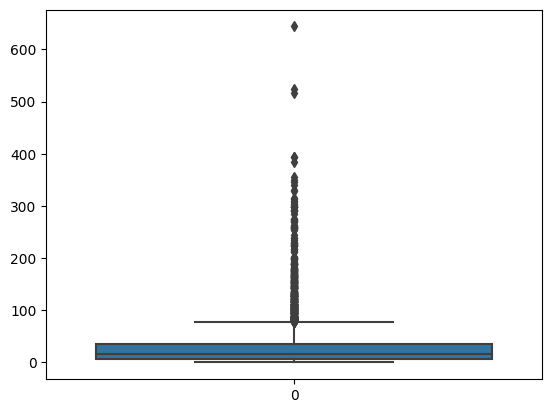

In [11]:
sns.boxplot(aviones[aviones['Total a Bordo'] != '?']['Total a Bordo'].values)

Pareciera que hay muchos valores atipicos pero realizare una investigacion hacerca de los mayores a 500.

In [12]:
Total_bordo = aviones[aviones['Total a Bordo'] != '?']

Cambiamos el tipo de variable, de str a int para poder aplicar un filtro.

In [13]:
Total_bordo['Total a Bordo'] = [int(x) for x in Total_bordo['Total a Bordo'].values]

C:\Users\Win10\AppData\Local\Temp\ipykernel_15548\1103189577.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Total_bordo['Total a Bordo'] = [int(x) for x in Total_bordo['Total a Bordo'].values]


Aplicamos el filtro para ver los valores > 500

In [14]:
Total_bordo[Total_bordo['Total a Bordo'] > 500]

,Fecha,Hora Declarada,Ruta,Operador,Motivos,Tipo de Aeronave,Total a Bordo,Pasajeros a Bordo,Tripulacion a Bordo,Total de Fallecidos,Pasajeros Fallecidos,Fallecidos Tripulacion,Fallecidos en Tierra,Sumario
2902,"March 27, 1977",1707,"Tenerife, Canary Islands",Pan American World Airways / KLM,Tenerife - Las Palmas / Tenerife - Las Palmas,Boeing B-747-121 / Boeing B-747-206B,644,614,30,583,560,23,0,Both aircraft were diverted to Tenerife becaus...
3341,"August 12, 1985",1856,"Mt. Osutaka, near Ueno Village, Japan",Japan Air Lines,Tokyo - Osaka,Boeing B-747-SR46,524,509,15,520,505,15,0,The aircraft suffered an aft pressure bulkhead...
4219,"July 23, 1999",1125,"Tokyo, Japan",All Nippon Airways,"Tokyo, Japan - Chitose, Japan",Boeing B-747,517,503,14,1,0,1,0,Two minutes after taking off from Haneda Airpo...


Luego de realizar este filtro vemos que los outliers no son por errores humanos o alguna otra falla, si no accidentes donde habian una alta cantidad de personas afectadas, esto lo podemos corroborar con las columnas **Pasajeros a Bordo**.

Ahora hare el mismo procedimiento con la columna **Pasajeros a Bordo**

creamos el grafico de caja:

<Axes: >

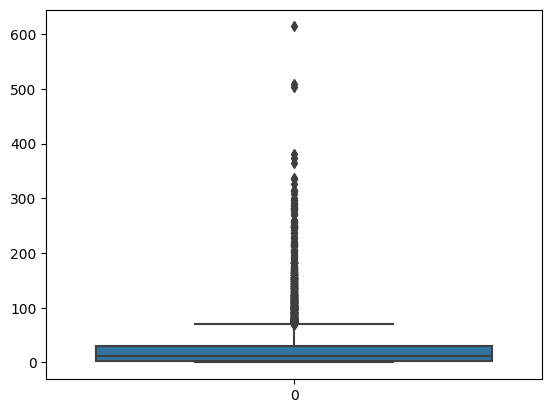

In [15]:
sns.boxplot(aviones[aviones['Pasajeros a Bordo'] != '?']['Pasajeros a Bordo'].values)

Vemos que los valores atipicos tienen un mismo comportamiento que la columna anterior.

Seguiremos con la siguiente columna Tripulacion a Bordo

<Axes: >

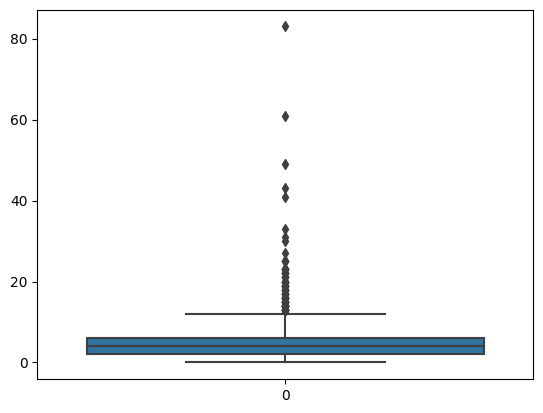

In [16]:
sns.boxplot(aviones[aviones['Tripulacion a Bordo'] != '?']['Tripulacion a Bordo'].values)

Aqui volveremos a aplicar un filtro para ver el comportamiento de los datos cuando es > 60.

In [18]:
Tripulantes = aviones[aviones['Tripulacion a Bordo'] != '?']

In [19]:
Tripulantes['Tripulacion a Bordo'] = [int(x) for x in Tripulantes['Tripulacion a Bordo'].values]

C:\Users\Win10\AppData\Local\Temp\ipykernel_15548\3481408902.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Tripulantes['Tripulacion a Bordo'] = [int(x) for x in Tripulantes['Tripulacion a Bordo'].values]


In [20]:
Tripulantes[Tripulantes['Tripulacion a Bordo'] > 60]

,Fecha,Hora Declarada,Ruta,Operador,Motivos,Tipo de Aeronave,Total a Bordo,Pasajeros a Bordo,Tripulacion a Bordo,Total de Fallecidos,Pasajeros Fallecidos,Fallecidos Tripulacion,Fallecidos en Tierra,Sumario
364,"February 12, 1935",?,"Off Point Sur, Californiia",Military - US Navy,?,Goodyear-Zeppelin U.S.S. Macon (airship),83,0,83,2,0,2,0,The airship suffered structural failure in a s...
462,"May 06, 1937",1925,"Lakehurst, New Jersey",Deutsche Zeppelin Reederei,Frankfurt - Lakehurst N.J.,Zeppelin LZ-129,97,36,61,35,13,22,1,The airship Hindenburg caught fire and burned ...


vemos que sucede con las columnas anteriores que no son errores humanos al cargar o transmitir los datos, si no que tiene relacion con total a bordo

Continuare con la siguiente columna total fallecidos

<Axes: >

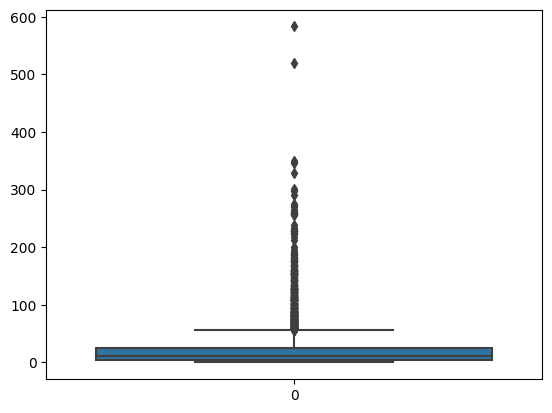

In [23]:
sns.boxplot(aviones[aviones['Total de Fallecidos'] != '?']['Total de Fallecidos'].values)

Vemos que tiene una relacion con los valores atipicos de las columnas Total a bordo y pasajeros a bordo

Sigamos con la siguiente columna pasajeros fallecidos.

<Axes: >

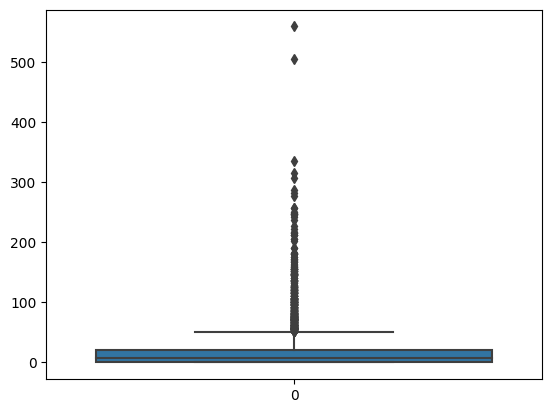

In [24]:
sns.boxplot(aviones[aviones['Pasajeros Fallecidos'] != '?']['Pasajeros Fallecidos'].values)

Vemos que tiene una relacion con la columna anteriormente mensionada y tambien con las otras 2 columnas mencionadas en el analisis de la columna anterior.

Sigamos con la siguiente columna

<Axes: >

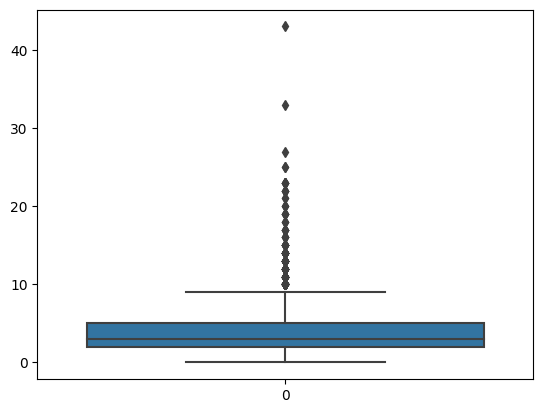

In [25]:
sns.boxplot(aviones[aviones['Fallecidos Tripulacion'] != '?']['Fallecidos Tripulacion'].values)

Al parecer se comporta igual que las anteriores columnas.

Pasare a la ultima columna Fallidos en tierra.

<Axes: >

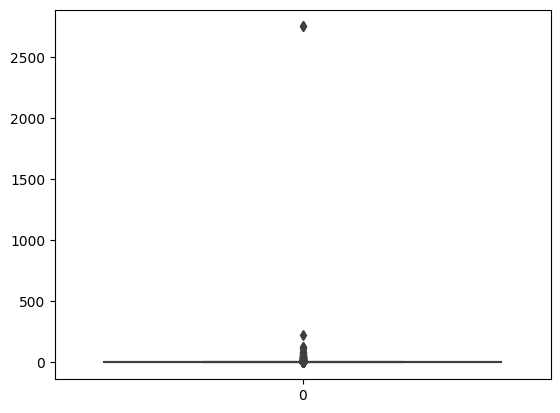

In [35]:
sns.boxplot(aviones[aviones['Fallecidos en Tierra'] != '?']['Fallecidos en Tierra'].values)

Parece que hay un valor muy atipico, hare un filtro para realizar un analisis.

In [36]:
Tierra = aviones[aviones['Fallecidos en Tierra'] != '?']

In [37]:
Tierra['Fallecidos en Tierra'] = [int(x) for x in Tierra['Fallecidos en Tierra'].values]

C:\Users\Win10\AppData\Local\Temp\ipykernel_15548\2758514504.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Tierra['Fallecidos en Tierra'] = [int(x) for x in Tierra['Fallecidos en Tierra'].values]


In [38]:
Tierra[Tierra['Fallecidos en Tierra'] > 1000]

,Fecha,Hora Declarada,Ruta,Operador,Motivos,Tipo de Aeronave,Total a Bordo,Pasajeros a Bordo,Tripulacion a Bordo,Total de Fallecidos,Pasajeros Fallecidos,Fallecidos Tripulacion,Fallecidos en Tierra,Sumario
4346,"September 11, 2001",0847,"New York City, New York",American Airlines,Boston - Los Angeles,Boeing 767-223ER,92,81,11,92,81,11,2750,The aircraft was hijacked shortly after it lef...
4347,"September 11, 2001",0903,"New York City, New York",United Air Lines,Boston - Los Angeles,Boeing B-767-222,65,56,9,65,56,9,2750,The aircraft was hijacked shortly after it lef...


La conclusion es que se debe al atentado a las torres gemelas, por esa razon la gran cantidad de afectados en Tierra.

Terminado el Analisis en busca de valores atipicos, creare un nuevo csv donde los datos '?' estaran convertidos en Nulos para poder hacer un tratamiento a los datos nulos en PowerBI

In [9]:
Accidentes_aviones.to_csv('Accidentes_Aviones_nuevo.csv',index=False)